# 1. Motion Denoising Using Deep Learning

This is the colab notebook of the project `Motion Denoising using Deep Learing`.

We start off by cloning the repo and installing the necessary requirements.

## 1. 1. Dependencies

Install requirements for the project and checkout GPU configureation.

In [2]:
# Check out GPU.
!nvidia-smi -L

GPU 0: Tesla P100-PCIE-16GB (UUID: GPU-c01356d6-730b-8421-d65b-cdfe9544bc35)


In [3]:
# clone repository.
!git clone https://github.com/TariqBerrada/Motion-Denoising

# Download training database.
%cd Motion-Denoising
%mkdir weights
%mkdir -p data/db
%cd data/db
!gdown https://drive.google.com/uc?id=1bsg7atlQGhsxIKzNQfyTD61aro5Xk9A_
%cd ../..

# Download pretrained weights.
%cd weights
!gdown https://drive.google.com/uc?id=13UzduMiT-_e73kk3-tManvPFhC0q7dC7
!gdown https://drive.google.com/uc?id=17UgOuvOACy5uyu6rSPsddFNtaccyBufr
%cd ..

# Subsample data at 120Hz by a factor of 5 --> 24 frames/sec.
%cd data/db
import joblib
data = joblib.load('database.pt')
for k, v in data.items():
  data[k] = data[k][::5, :]
joblib.dump(data, 'database.pt')
del data
%cd ../..

# Download necessary packages and enables OpenGL.
!pip install git+https://github.com/nghorbani/body_visualizer --quiet
!pip install git+https://github.com/MPI-IS/configer.git --quiet
!pip install git+https://github.com/MPI-IS/mesh.git --quiet

!pip install trimesh --quiet
!pip install pyrender --quiet
!pip install git+https://github.com/nghorbani/human_body_prior --quiet

import os
os.environ['PYOPENGL_PLATFORM'] = 'egl'

Cloning into 'Motion-Denoising'...
remote: Enumerating objects: 554, done.
remote: Counting objects: 100% (238/238), done.
remote: Compressing objects: 100% (161/161), done.
remote: Total 554 (delta 146), reused 141 (delta 77), pack-reused 316
Receiving objects: 100% (554/554), 218.48 MiB | 39.24 MiB/s, done.
Resolving deltas: 100% (299/299), done.
Checking out files: 100% (65/65), done.
/content/Motion-Denoising
/content/Motion-Denoising/data/db
Downloading...
From: https://drive.google.com/uc?id=1bsg7atlQGhsxIKzNQfyTD61aro5Xk9A_
To: /content/Motion-Denoising/data/db/database.pt
100% 1.87G/1.87G [00:15<00:00, 118MB/s]
/content/Motion-Denoising
/content/Motion-Denoising/weights
Downloading...
From: https://drive.google.com/uc?id=13UzduMiT-_e73kk3-tManvPFhC0q7dC7
To: /content/Motion-Denoising/weights/ckpt.pth
100% 9.81M/9.81M [00:00<00:00, 35.8MB/s]
Downloading...
From: https://drive.google.com/uc?id=17UgOuvOACy5uyu6rSPsddFNtaccyBufr
To: /content/Motion-Denoising/weights/ckpt_denoiser.p

# 2. Training Models

In this section we train the Variational Autoencoder and the Neural Denoiser model.

## 2. 1. Variational Autoencoder

In [ ]:
# Train VAE.
!python train.py

(-0.5, 2299.5, 999.5, -0.5)

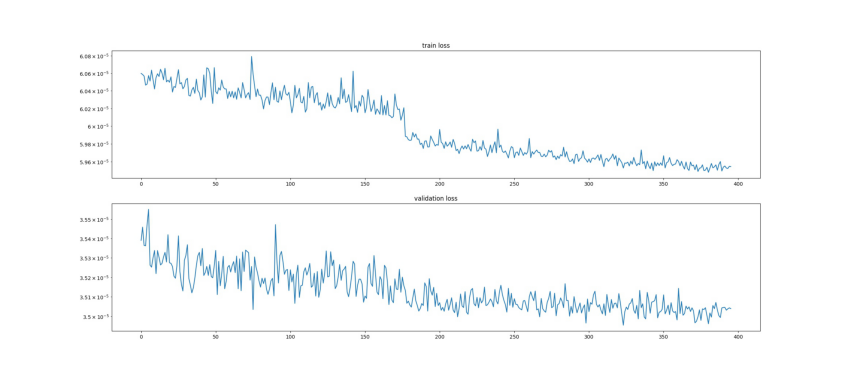

In [ ]:
# Learning curves.
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize = (15, 7))
plot = plt.imread('learning.jpg')
plt.imshow(plot)
plt.axis('off')

### Evaluate performance of the trained VAE

This script will run reconstruction and interpolation tests and generate the corresponding image and video files.

In [ ]:
!python test.py

Running reconstruction test.
Rendering animation : 150 frames - 120 frames/sec. - resolution(600, 600)
OpenCV: FFMPEG: tag 0x58564944/'DIVX' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'
100% 150/150 [00:07<00:00, 20.17it/s]
Rendering animation : 150 frames - 120 frames/sec. - resolution(600, 600)
OpenCV: FFMPEG: tag 0x58564944/'DIVX' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'
100% 150/150 [00:07<00:00, 19.47it/s]
Running interpolation test.
Rendering animation : 250 frames - 120 frames/sec. - resolution(600, 600)
OpenCV: FFMPEG: tag 0x58564944/'DIVX' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'
100% 250/250 [00:12<00:00, 20.21it/s]
Rendering animation : 250 frames - 120 frames/sec. - resolution(600, 600)
OpenCV: FFMPEG: tag 0x58564944/'DIV

Example of reconstruction results.\
For each row, the ground truth pose is on the left and the reconstruction generated by the VAE to its right.

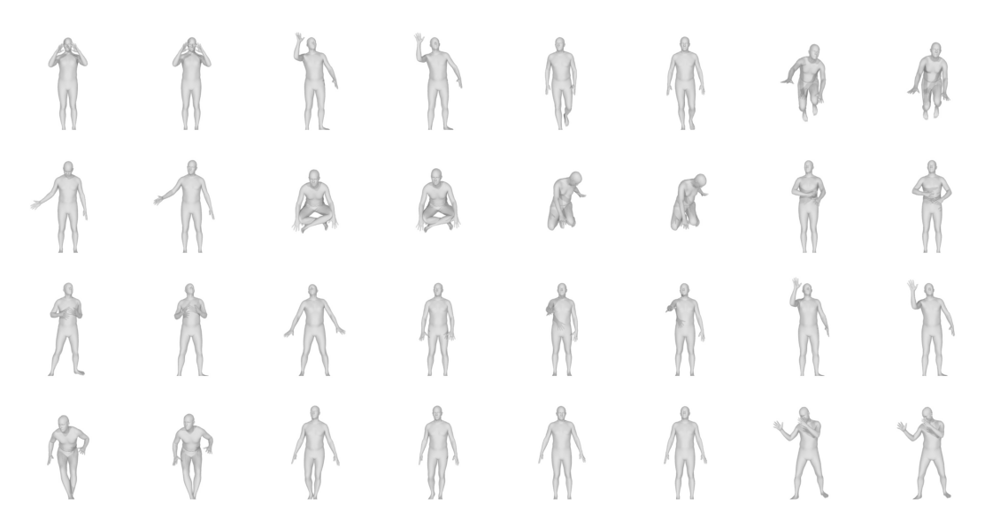

In [ ]:
preds_example = plt.imread('renderings/preds.jpg')
plt.figure(figsize = (20, 26))
plt.imshow(preds_example)
plt.axis(('off'))
plt.show()

## 2. 2. Neural Denoiser model

In [ ]:
!python train_denoiser.py

  0%|          | 0/100 [00:00<?, ?it/s]
0 - train_loss : 0.016724298892410054 - validation_loss : 0.000203948938896246
1 - train_loss : 0.00012146900952028294 - validation_loss : 4.777681165778048e-05
2 - train_loss : 8.333156652543195e-05 - validation_loss : 4.555012555407351e-05
3 - train_loss : 8.152036203806295e-05 - validation_loss : 4.4694678810576565e-05
4 - train_loss : 8.05138832816039e-05 - validation_loss : 4.46237541984095e-05
5 - train_loss : 8.045538397493488e-05 - validation_loss : 4.449029930754907e-05
6 - train_loss : 7.933803758939654e-05 - validation_loss : 4.3907192408465955e-05
7 - train_loss : 7.89839867088741e-05 - validation_loss : 4.370351723644448e-05
8 - train_loss : 7.931685912124905e-05 - validation_loss : 4.452554816080074e-05
9 - train_loss : 8.004513472795623e-05 - validation_loss : 4.377835873974573e-05
10 - train_loss : 7.897363390313742e-05 - validation_loss : 4.4463906529950395e-05
11 - train_loss : 7.906806208243184e-05 - validation_loss : 4.3376243

## 2. 3. Save checkpoints to Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

%cd /content/gdrive/My\ Drive/Denoising
%cp ../../../Motion-Denoising/weights/ckpt_denoiser.pth ./ckpt_denoiser.pth
%cd ../../../Motion-Denoising

Mounted at /content/gdrive


In [ ]:
from IPython.display import HTML
from base64 import b64encode
 
def show_video(video_path, video_width = 600):
   
  video_file = open(video_path, "r+b").read()
 
  video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
  return HTML(f"""<video width={video_width} controls><source src="{video_url}"></video>""")
 
show_video('renderings/interpolation_p.mp4')

# 3. Trajectory analysis

In this section we run experiments on the trajectory of the animations in the latent space.\
This will give us information about whether or not the VAE model can be used to generate plausible animations by interpolating through the latent space.

In [4]:
from models.model import Network
import torch

import numpy as np
from utils.render import render_pose, render_pose_sequence

from moviepy.editor import *

import matplotlib.pyplot as plt
plt.style.use('seaborn')

model = Network(63, 28).cuda()
model.load_state_dict(torch.load('weights/ckpt.pth', map_location='cpu'))

data = joblib.load('data/db/database.pt')
pose0 = torch.tensor(data['pose'][[32], 3:66], dtype = torch.float32, device ='cuda')
pose1 = torch.tensor(data['pose'][[173], 3:66], dtype = torch.float32, device ='cuda')

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)2957312/45929032 bytes (6.4%)7094272/45929032 bytes (15.4%)11173888/45929032 bytes (24.3%)15327232/45929032 bytes (33.4%)19251200/45929032 bytes (41.9%)23371776/45929032 bytes (50.9%)27418624/45929032 bytes (59.7%)31399936/45929032 bytes (68.4%)35487744/45929032 bytes (77.3%)39411712/45929032 bytes (85.8%)43491328/45929032 bytes (94.7%)45929032/45929032 bytes (100.0%)
  Done
File saved as /root

In the following experiment, we will render a random animation from our test set, its corresponding reconstruction, and its t-SNE distribution.

In [ ]:
pose_seq = torch.tensor(data['pose'][190:290, 3:66], dtype = torch.float32, device='cuda')
pose_pred, _, _ = model(pose_seq)
render_pose_sequence(pose_seq, out_dir='renderings/sequence_gt.avi')
render_pose_sequence(pose_pred, out_dir='renderings/sequence_p.avi')

Rendering animation : 100 frames - 60 frames/sec. - resolution(600, 600)


100%|██████████| 100/100 [00:05<00:00, 17.39it/s]


Rendering animation : 100 frames - 60 frames/sec. - resolution(600, 600)


100%|██████████| 100/100 [00:05<00:00, 18.18it/s]


Pose from the dataset.

In [ ]:
# ground truth sequence.
clip_gt=VideoFileClip("renderings/sequence_gt.avi" )
clip_gt.ipython_display(width=350)

100%|██████████| 101/101 [00:00<00:00, 228.48it/s]


Reconstruction.

In [ ]:
clip_p=VideoFileClip("renderings/sequence_p.avi" )
clip_p.ipython_display(width=350)

100%|██████████| 101/101 [00:00<00:00, 210.68it/s]


We can look at the profil of the animation and its reconstruction using TSNE to compress data into two dimensions.

* The first row plots the phase diagrams of the TSNE embedding dimensions $\big ( x_2 = f(x_1) \big )$, which gives information about the accuracy of the frame-by-frame reconstructions
* The second row show the correspondence of the TSNE components between the ground truth and reconstructed animations, a quasi-linear correspondence indicates accurate reconstructions. 

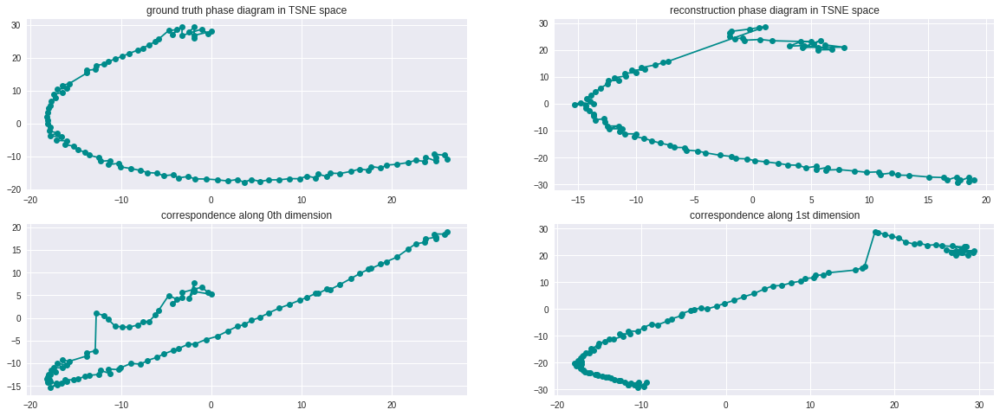

In [ ]:
from sklearn.manifold import TSNE

pose_c = TSNE(n_components=2, learning_rate='auto', init='pca', perplexity=9).fit_transform(pose_seq.detach().cpu().numpy())
rec_r = TSNE(n_components=2, learning_rate='auto', init='pca', perplexity=9).fit_transform(pose_pred.detach().cpu().numpy())

fig, ax = plt.subplots(2, 2, figsize = (20, 8))
ax[0][0].plot(pose_c[:, 0], pose_c[:, 1], 'o-', c='darkcyan')
ax[0][0].set_title('ground truth phase diagram in TSNE space')
ax[0][1].plot(rec_r[:, 0], rec_r[:, 1], 'o-', c='darkcyan')
ax[0][1].set_title('reconstruction phase diagram in TSNE space')

ax[1][0].plot(pose_c[:, 0], rec_r[:, 0], 'o-', c='darkcyan')
ax[1][0].set_title('correspondence along 0th dimension')
ax[1][1].plot(pose_c[:, 1], rec_r[:, 1], 'o-', c='darkcyan')
ax[1][1].set_title('correspondence along 1st dimension')
plt.show()

We can look at the TSNE embedding of the latent code, equidistant latent codes mean that we can interpolate through the latent space to generate plausible animations.

Text(0.5, 1.0, 'latent code embedding using TSNE for an example animation')

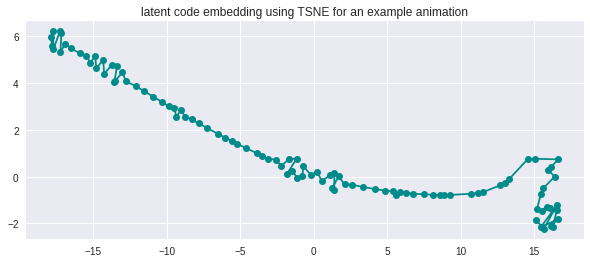

In [ ]:
from sklearn.manifold import TSNE
z = model.encode(pose_seq[None])[0]
z_embedd = TSNE(n_components=2, learning_rate='auto', init='pca', perplexity=16).fit_transform(z.detach().cpu().numpy())
plt.figure(figsize = (10, 4))
# plt.plot(z.detach().cpu().numpy()[:, 2], '-o')
plt.plot(z_embedd[:, 0], z_embedd[:, 1], 'o-', c = 'darkcyan')
plt.title('latent code embedding using TSNE for an example animation')


What about interpolated plots in rotation space and the Variational Autoencoder's latent space ?

* Here we have two different poses and plot TSNE embedding of the interpolation result in both pose space and latent space.

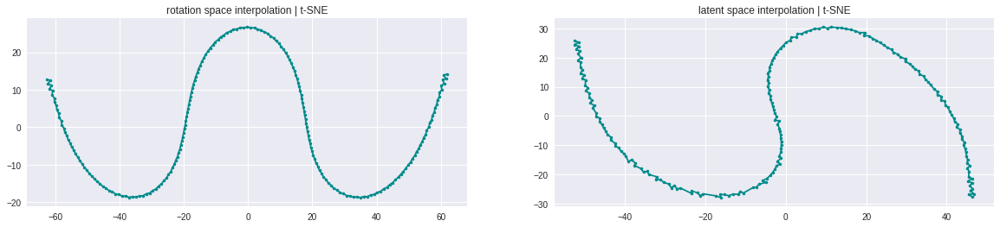

In [ ]:
pose0 = pose_seq[[0], :]
pose1 = pose_seq[[-1], :]

pose_rot_torch = torch.cat([w*pose0 + (1-w)*pose1 for w in np.linspace(0, 1, 200)])
pose_latent_torch, _, _ = model(pose_rot_torch)

pose_rot = pose_rot_torch.detach().cpu().numpy()
pose_latent = pose_latent_torch.detach().cpu().numpy()

pose_c = TSNE(n_components=2, learning_rate='auto', init='pca', perplexity =7).fit_transform(pose_rot)
rec_r = TSNE(n_components=2, learning_rate='auto', init='pca', perplexity = 7).fit_transform(pose_latent)

fig, ax = plt.subplots(1, 2, figsize = (20, 4))
ax[0].plot(pose_c[:, 0], pose_c[:, 1], '.-', c='darkcyan')
ax[0].set_title('rotation space interpolation | t-SNE')
ax[1].plot(rec_r[:, 0], rec_r[:, 1], '.-', c='darkcyan')
ax[1].set_title('latent space interpolation | t-SNE')
plt.show()

Corresponding animations : 

In [ ]:
render_pose_sequence(pose_rot_torch, out_dir='renderings/interpolation_rot.avi')

clip=VideoFileClip("renderings/interpolation_rot.avi" )
clip.ipython_display(width=350)

Rendering animation : 200 frames - 60 frames/sec. - resolution(600, 600)


100%|██████████| 200/200 [00:00<00:00, 268.94it/s]


In [ ]:
render_pose_sequence(pose_latent_torch, out_dir='renderings/interpolation_latent.avi')

clip=VideoFileClip("renderings/interpolation_latent.avi" )
clip.ipython_display(width=350)

Rendering animation : 200 frames - 60 frames/sec. - resolution(600, 600)


100%|██████████| 200/200 [00:00<00:00, 259.18it/s]


From the images above we can see that the latent space interpolation yields more constrained movements, but the movement progression in general is more plausible and realistic than simple interpolation in the original rotation space.

# 4. Noisy animation reconstruction

Here we will add homoscedatic noise to each joint rotation and try to reconstruct a smooth version of the ground truth.

The noise is modeled by i.i.d centered normal distributions, with a standard deviation of $\sigma = 0.1$:

$$\theta_n = \hat{\theta} + \epsilon \quad with \quad \epsilon \sim \mathcal{N}(0, \sigma I)$$

We then experiment with different reconstruction methods : \
* Interpolation.
* Gradient descent.
* Sparse dictionary learning approach using gradient descent on a sinusoidal basis.

In [ ]:
poses = torch.tensor(data['pose'][4150:4350, 3:66], dtype = torch.float32, device='cuda')
render_pose_sequence(poses, out_dir='renderings/sequence_0.avi', fps = 30)

clip=VideoFileClip("renderings/sequence_0.avi" )
clip.ipython_display(width=350)

Rendering animation : 200 frames - 30 frames/sec. - resolution(600, 600)


100%|██████████| 201/201 [00:01<00:00, 185.17it/s]


In [ ]:
torch.manual_seed(0)
noise = torch.normal(0, 0.03, size = poses.shape, device = poses.device, dtype = torch.float32)
noise[:, :3] = 0.
noised = poses + noise

render_pose_sequence(noised, out_dir='renderings/sequence_noised.avi', fps = 30)

clip=VideoFileClip("renderings/sequence_noised.avi" )
clip.ipython_display(width=350)

Rendering animation : 200 frames - 30 frames/sec. - resolution(600, 600)


100%|██████████| 201/201 [00:01<00:00, 183.12it/s]


## 4. 1. Gradient descent for constrained optimization

In this section, we follow a gradient descent approach in order to optimize a randomly generated sequence.

The loss function will consist of a recontruction term and a gradient penalty term.

$$L = ||x-\hat{x}||_2^2\ +\ \beta||\nabla \hat{x}||_2^2$$

100%|██████████| 10000/10000 [00:18<00:00, 534.49it/s]


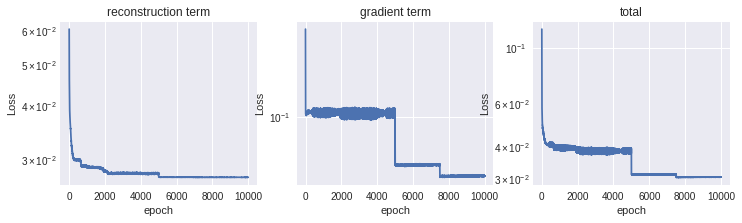

In [ ]:
import tqdm
from torch.autograd import Variable

z = Variable(torch.rand((200, 28), device = poses.device, dtype = torch.float32), requires_grad = True)

n_iter = 10000
lr = 0.05
beta = 0.1
optimizer=  torch.optim.Adam([z], lr = lr)

logs = {'rec' : [], 'grad' : [], 'tot' : []}

for i in tqdm.tqdm(range(n_iter)):
  optimizer.zero_grad()
  y = model.decode(z)
  loss_rec = (y - noised)**2
  # loss_grad = (z[1:, :] - z[:-1, :])**2
  loss_grad = torch.abs(z[2:, :] - 2*z[1:-1] + z[:-2])
  # loss_grad = (torch.abs(z[2:, :] - z[1:-1]) - torch.abs(z[1:-1] - z[:-2]))**2
  loss = loss_rec.mean() + beta*(loss_grad).mean()

  logs['rec'].append(loss_rec.mean().item())
  logs['grad'].append(loss_grad.mean().item())
  logs['tot'].append(loss.item())

  loss.backward()
  optimizer.step()

  # input.data = input.data + lr*input.grad.data/input.grad.data.std()
  if i == n_iter//2:
    lr /= 5

  if i == int(3*n_iter/4):
    lr /= 2
  z.data = z.data - lr*z.grad.data/z.grad.data.std()


fig, ax = plt.subplots(1, 3, figsize = (12, 3))

ax[0].semilogy(logs['rec'])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('Loss')
ax[0].set_title('reconstruction term')

ax[1].semilogy(logs['grad'])
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('Loss')
ax[1].set_title('gradient term')

ax[2].semilogy(logs['tot'])
ax[2].set_xlabel('epoch')
ax[2].set_ylabel('Loss')
ax[2].set_title('total')

plt.show()

In [ ]:
result = model.decode(z)

render_pose_sequence(result, out_dir='renderings/result_grad.avi', fps = 30)

clip=VideoFileClip("renderings/result_grad.avi" )
clip.ipython_display(width=350)

Rendering animation : 200 frames - 30 frames/sec. - resolution(600, 600)


100%|██████████| 201/201 [00:00<00:00, 259.64it/s]


In [ ]:
# poses, noised, result
error_noise = (poses- noised).detach().cpu().numpy()
error_result = (poses - result).detach().cpu().numpy()

lap_noise = ((noised[2:, :] - 2*noised[1:-1] + noised[:-2])**2).detach().cpu().numpy()
lap_result = ((result[2:, :] - 2*result[1:-1] + result[:-2])**2).detach().cpu().numpy()

(200, 63) (200, 63)


In [ ]:
print('mse', error_noise.mean(), error_result.mean(), error_noise.std(), error_result.std())
print('lap', lap_noise.mean(), lap_result.mean(), lap_noise.std(), lap_result.std())

mse 0.0006582578 0.0026862144 0.09996118 0.13498065
lap 0.06009602 0.004322548 0.085312106 0.02577787


(0.0, 0.4)

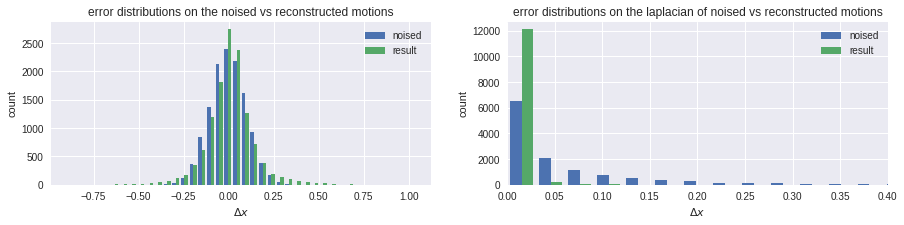

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(15, 3))

ax[0].hist((error_noise.flatten(), error_result.flatten()), label = ['noised', 'result'], bins = 40, log = False)
ax[0].set_title('error distributions on the noised vs reconstructed motions')
ax[0].set_xlabel('$\Delta x$')
ax[0].set_ylabel('count')
handles, labels = ax[0].get_legend_handles_labels()
# sort both labels and handles by labels
labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
ax[0].legend(handles, labels)


ax[1].hist((lap_noise.flatten(), lap_result.flatten()), label = ['noised', 'result'], bins = 40, log = False)
ax[1].set_title('error distributions on the laplacian of noised vs reconstructed motions')
ax[1].set_xlabel('$\Delta x$')
ax[1].set_ylabel('count')
handles, labels = ax[1].get_legend_handles_labels()
# sort both labels and handles by labels
labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
ax[1].legend(handles, labels)
ax[1].set_xlim(0, 0.4)

Most of the details of the animation are lost, we need to think about a better method then.

* What if we initialize with the noised encoding instead ?

100%|██████████| 40000/40000 [01:52<00:00, 356.14it/s]


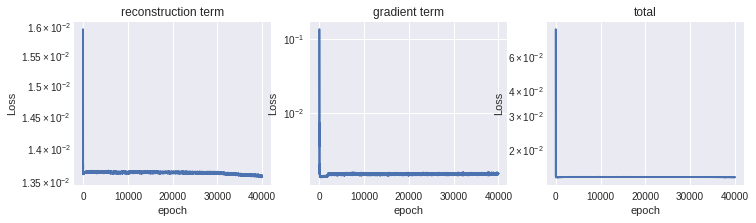

In [ ]:
import tqdm
from torch.autograd import Variable

z = Variable(model.encode(noised)[0], requires_grad = True)
z0 = z.detach().cpu().numpy()

n_iter = 40000
lr = 0.1
beta = .5
optimizer=  torch.optim.Adam([z], lr = lr)

logs = {'rec' : [], 'grad' : [], 'tot' : []}

for i in tqdm.tqdm(range(n_iter)):
  optimizer.zero_grad()
  y = model.decode(z)
  loss_rec = (y - noised)**2
  # loss_grad = (z[1:, :] - z[:-1, :])**2
  loss_grad = (z[2:, :] - 2*z[1:-1] + z[:-2])**2
  loss = loss_rec.mean() + beta*(loss_grad).mean()

  logs['rec'].append(loss_rec.mean().item())
  logs['grad'].append(loss_grad.mean().item())
  logs['tot'].append(loss.item())

  loss.backward()
  optimizer.step()


fig, ax = plt.subplots(1, 3, figsize = (12, 3))

ax[0].semilogy(logs['rec'])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('Loss')
ax[0].set_title('reconstruction term')

ax[1].semilogy(logs['grad'])
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('Loss')
ax[1].set_title('gradient term')

ax[2].semilogy(logs['tot'])
ax[2].set_xlabel('epoch')
ax[2].set_ylabel('Loss')
ax[2].set_title('total')

plt.show()

In [ ]:
result = model.decode(z)

render_pose_sequence(result, out_dir='renderings/result_grad_x0.avi', fps = 25)

clip=VideoFileClip("renderings/result_grad_x0.avi" )
clip.ipython_display(width=350)

Rendering animation : 200 frames - 25 frames/sec. - resolution(600, 600)


100%|█████████▉| 200/201 [00:00<00:00, 204.63it/s]


In [ ]:
# poses, noised, result
error_noise = (poses- noised).detach().cpu().numpy()
error_result_init = (poses - result).detach().cpu().numpy()

lap_noise = ((noised[2:, :] - 2*noised[1:-1] + noised[:-2])**2).detach().cpu().numpy()
lap_result_init = ((result[2:, :] - 2*result[1:-1] + result[:-2])**2).detach().cpu().numpy()

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(15, 3))

ax[0].hist((error_noise.flatten(),error_result_init.flatten()), label = ['noised', 'result_n'], bins = 30, log = True)
ax[0].set_title('error distributions on the noised vs reconstructed motions')
ax[0].set_xlabel('$\Delta x$')
ax[0].set_ylabel('count (log scale)')
handles, labels = ax[0].get_legend_handles_labels()
# sort both labels and handles by labels
labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
ax[0].legend(handles, labels)


ax[1].hist((lap_noise.flatten(), lap_result.flatten(), lap_result_init.flatten()), label = ['noised', 'result_rd', 'result_n'], bins = 30, log = False)
ax[1].set_title('error distributions on the laplacian of noised vs reconstructed motions')
ax[1].set_xlabel('$\Delta x$')
ax[1].set_ylabel('count')
handles, labels = ax[1].get_legend_handles_labels()
# sort both labels and handles by labels
labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
ax[1].legend(handles, labels)
ax[1].set_xlim(0, 0.1)

## 4. 2. Dictionary learning for motion reconstruction

During this part we make use of Wavelets to find the motion reconstruction within a basis, as the pixel-wise reconstruction could be too inefficient.

We use a sinusiodal model given by :

$$x[n] = \sum_{i=1}^{N_h} a_i \text{sin}\Big (2\pi(if_0){n \over F_s}+\phi_i \Big ) + b[n]$$ 

In [ ]:
from models.model import Network
import torch

import numpy as np
from utils.render import render_pose, render_pose_sequence

from moviepy.editor import *

import matplotlib.pyplot as plt
plt.style.use('seaborn')

model = Network(63, 28).cuda()
model.load_state_dict(torch.load('weights/ckpt.pth', map_location='cpu'))

data = joblib.load('data/db/database.pt')

poses = torch.tensor(data['pose'][4150:4350, 3:66], dtype = torch.float32, device='cuda')
render_pose_sequence(poses, out_dir='renderings/sequence_0.avi', fps = 30)

clip=VideoFileClip("renderings/sequence_0.avi" )
clip.ipython_display(width=350)

Rendering animation : 200 frames - 30 frames/sec. - resolution(600, 600)


100%|██████████| 201/201 [00:00<00:00, 211.62it/s]


In [ ]:
device = 'cuda'

n = 200 # number of timesteps
nh = 3*28 # number of harmonics
Fs = 1000 # sampling frequency
f0 = Fs//(3*n) # fundamental frequency

nz = 28 # dimension of latent code

S = np.zeros((nz, n, nh))
for i in range(n):
  for j in range(nh):
    S[:, i, j] = 2*np.pi*((i*f0)/Fs)*j
freq = torch.tensor(S, device = 'cuda', dtype = torch.float32, requires_grad = False)

def get_code(A, phi,b, freq = freq):
  freq = torch.sin(freq.transpose(1, 0) + phi)
  code = torch.einsum('ijk, jk -> ij', freq, A)
  code = code + b
  return code

  0%|          | 0/20000 [00:00<?, ?it/s]

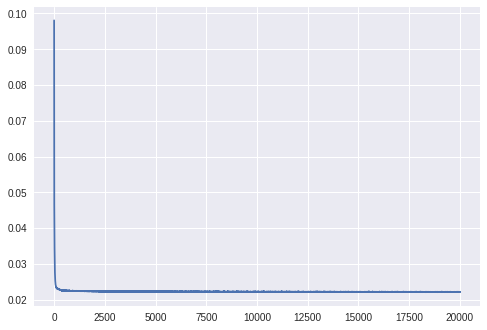

Rendering animation : 200 frames - 30 frames/sec. - resolution(600, 600)


100%|██████████| 201/201 [00:00<00:00, 205.29it/s]


In [ ]:
from tqdm.notebook import tqdm

# Now we do the gradient descent to learn the phase and amplitude parameters.
n_iter = 20000
lr = 0.02
wd = .5 # loss weight decay

noise = torch.normal(0, 0.03, size = poses.shape, device = poses.device, dtype = torch.float32)
noise[:, :3] = 0.
noised = poses + noise

# phase and amplitude initialized from a standard normal distrubtion.
phi = torch.normal(torch.zeros(nz, nh), .1*torch.ones(nz, nh)).cuda()
A = torch.normal(torch.zeros(nz, nh), .1*torch.ones(nz, nh)).cuda()
b= torch.normal(torch.zeros(nz), .1*torch.ones(nz)).cuda()

phi = torch.autograd.Variable(phi, requires_grad = True)
A = torch.autograd.Variable(A, requires_grad = True)
b = torch.autograd.Variable(b, requires_grad = True)

optimizer=  torch.optim.Adam([A, phi, b], lr = lr)
criterion = torch.nn.MSELoss(reduction='mean')

logs = {'rec' : [], 'grad' : []}

for i in tqdm(range(n_iter)):
  optimizer.zero_grad()

  z = get_code(A, phi, b)
  y = model.decode(z)

  l1 = (torch.abs(A)).mean()
  loss = criterion(y, noised) + wd*l1 # poses instead of noised

  loss.backward()
  optimizer.step()

  logs['rec'].append(loss.item())

  # print(z.grad)
  # logs['grad'].append(z.grad.data.norm.item())

  # if i == n_iter//2:
  #   lr /= 5

  # Normalized update.
  # A.data = A.data - lr*A.grad.data/A.grad.data.std()
  # phi.data = phi.data - lr*phi.grad.data/phi.grad.data.std()

res = model.decode(z)

plt.figure()
plt.plot(logs['rec'])
plt.show()

# visualize results
render_pose_sequence(res, out_dir='renderings/res.avi', fps = 30)

clip=VideoFileClip("renderings/res.avi" )
clip.ipython_display(width=350)

(array([2., 0., 1., 3., 4., 5., 7., 9., 9., 6., 5., 9., 3., 4., 8., 2., 1.,
        2., 2., 2.]),
 array([-0.02968786, -0.02667771, -0.02366756, -0.0206574 , -0.01764725,
        -0.0146371 , -0.01162695, -0.0086168 , -0.00560665, -0.00259649,
         0.00041366,  0.00342381,  0.00643396,  0.00944411,  0.01245426,
         0.01546442,  0.01847457,  0.02148472,  0.02449487,  0.02750502,
         0.03051518], dtype=float32),
 <a list of 20 Patch objects>)

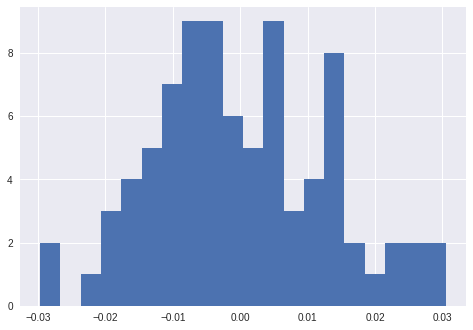

In [ ]:
plt.hist(A[0].detach().cpu().numpy(), bins =  20)

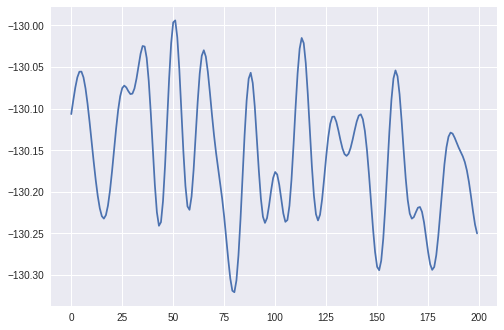

In [ ]:
plt.plot(z[:, 0].detach().cpu().numpy())

In [ ]:
# poses, noised, result
error_noise = ((poses- noised)**2).detach().cpu().numpy()
error_result = ((poses - res)**2).detach().cpu().numpy()

lap_noise = ((noised[2:, :] - 2*noised[1:-1] + noised[:-2])**2).detach().cpu().numpy()
lap_result = ((res[2:, :] - 2*res[1:-1] + res[:-2])**2).detach().cpu().numpy()
grad_noise = ((noised[1:, :] - noised[:-1])**2).detach().cpu().numpy()
grad_result = ((res[1:, :] - res[:-1])**2).detach().cpu().numpy()
print('MSE : ', error_noise.mean(), error_result.mean())
print('laplacian : ', lap_noise.mean(), lap_result.mean())
print('grad : ', grad_noise.mean(), grad_result.mean())

MSE :  0.00085996446 0.015745882
laplacian :  0.005734452 0.001062295
grad :  0.0026492474 0.0010372143


## 4. 3. Linear Interpolation on dowsampled data

In [ ]:
torch.manual_seed(0)
noise = torch.normal(0, 0.1, size = poses.shape, device = poses.device, dtype = torch.float32)

noised = poses + noise
render_pose_sequence(noised, out_dir='renderings/sequence_noised.avi', fps = 30)

clip=VideoFileClip("renderings/sequence_noised.avi" )
clip.ipython_display(width=350)

dx = 10

z, _ = model.encode(noised)
z_padded = z[::dx][None].transpose(2, 1)

z_nearest = torch.nn.functional.interpolate(z_padded, size = z.shape[0], mode = 'nearest').transpose(2, 1)[0]
z_linear = torch.nn.functional.interpolate(z_padded, size = z.shape[0], mode = 'linear', align_corners = True).transpose(2, 1)[0]

z_new = z_padded[None].transpose(1, 2)
z_bicubic = torch.nn.functional.interpolate(z_new, size=(1,z.shape[0]), mode='bicubic')[0, :, 0, :].transpose(0, 1)

Rendering animation : 200 frames - 30 frames/sec. - resolution(600, 600)


100%|██████████| 201/201 [00:00<00:00, 239.06it/s]


In [ ]:
clip=VideoFileClip("renderings/sequence_noised.avi" )
clip.ipython_display(width=350)

100%|██████████| 201/201 [00:01<00:00, 123.21it/s]


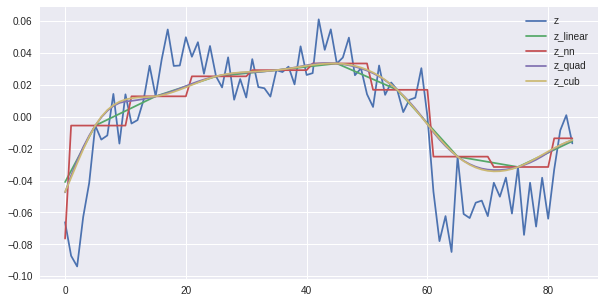

In [ ]:
from scipy.interpolate import interp1d

z_np = z.detach().cpu().numpy()
z_np = z_np[::dx]

f_n = interp1d(list(range(0, 200, dx)), z_np, axis = 0, kind = 'nearest',fill_value="extrapolate")
z_nn = f_n(list(range(200)))
z_nearest = torch.tensor(z_nn, dtype = torch.float32, device = 'cuda')

f_lin = interp1d(list(range(0, 200, dx)), z_np, axis = 0, fill_value="extrapolate")
z_lin = f_lin(list(range(200)))
z_linear = torch.tensor(z_lin, dtype = torch.float32, device = 'cuda')

f_quad = interp1d(list(range(0, 200, dx)), z_np, axis = 0, kind = 'quadratic', fill_value="extrapolate")
z_quad = f_quad(list(range(200)))
z_quadratic = torch.tensor(z_quad, dtype = torch.float32, device = 'cuda')

f_cub = interp1d(list(range(0, 200, dx)), z_np, axis = 0, kind = 'cubic', fill_value="extrapolate")
z_cub = f_cub(list(range(200)))
z_cubic = torch.tensor(z_cub, dtype = torch.float32, device = 'cuda')

plt.figure(figsize = (10, 5))
plt.plot(z.detach().cpu().numpy()[25:110, 0], label = 'z')
plt.plot(z_lin[25:110, 0], label = 'z_linear')
plt.plot(z_nn[25:110,0], label = 'z_nn')
plt.plot(z_quad[25:110, 0], label = 'z_quad')
plt.plot(z_cub[25:110, 0], label = 'z_cub')
plt.legend()

In [ ]:
result_nearest = model.decode(z_nearest)

render_pose_sequence(result_nearest, out_dir='renderings/interp_nearest.avi', fps = 30)

clip=VideoFileClip("renderings/interp_nearest.avi" )
clip.ipython_display(width=350)

Rendering animation : 200 frames - 30 frames/sec. - resolution(600, 600)


100%|██████████| 201/201 [00:00<00:00, 259.16it/s]


In [ ]:
result_linear = model.decode(z_linear)

render_pose_sequence(result_linear, out_dir='renderings/interp_linear.avi', fps = 30)

clip=VideoFileClip("renderings/interp_linear.avi" )
clip.ipython_display(width=350)

Rendering animation : 200 frames - 30 frames/sec. - resolution(600, 600)


100%|██████████| 201/201 [00:00<00:00, 233.48it/s]


In [ ]:
result_quadratic = model.decode(z_quadratic)

render_pose_sequence(result_quadratic, out_dir='renderings/interp_quadratic.avi', fps = 30)

clip=VideoFileClip("renderings/interp_quadratic.avi" )
clip.ipython_display(width=350)

Rendering animation : 200 frames - 30 frames/sec. - resolution(600, 600)


100%|██████████| 201/201 [00:00<00:00, 232.04it/s]


In [ ]:
result_cubic = model.decode(z_cubic)

render_pose_sequence(result_cubic, out_dir='renderings/interp_bicubic.avi', fps = 30)

clip=VideoFileClip("renderings/interp_bicubic.avi" )
clip.ipython_display(width=350)

Rendering animation : 200 frames - 30 frames/sec. - resolution(600, 600)


100%|██████████| 201/201 [00:00<00:00, 257.82it/s]


Let's calculate the MSE and gradient amplitude over each animation.

In [ ]:
method = ['noised', 'nearest_neighbor', 'linear', 'quadratic', 'cubic']

r_gt = poses.detach().cpu().numpy()[50:150]

r_n = noised.detach().cpu().numpy()[50:150]
r_nn = result_nearest.detach().cpu().numpy()[50:150]
r_linear = result_linear.detach().cpu().numpy()[50:150]
r_quadratic = result_quadratic.detach().cpu().numpy()[50:150]
r_cubic = result_cubic.detach().cpu().numpy()[50:150]

interp_r = [r_n, r_nn, r_linear, r_quadratic, r_cubic]

for i, res in enumerate(interp_r):
  mse = np.mean((res - r_gt)**2)
  grad = ((res[:-1]-res[1:] - (r_gt[:-1] - r_gt[1:]))**2).mean()
  print(method[i], ' : ', mse, grad)

torch.Size([200, 63]) torch.Size([200, 63])
noised  :  0.010087333 0.02012674
nearest_neighbor  :  0.02098794 0.0026272163
linear  :  0.021128904 0.00196646
quadratic  :  0.021506948 0.002249328
cubic  :  0.021625318 0.002197319


# 5. Test denoiser

In this section we run a test on the neural denoiser model on an example animation.\
This model learns a sinusoidal decomposition of the latent codes using the same decomposition as before.\
Additionally, it makes use of LSTM block to learn better features that will be used to predict the amplitude, phase and offset parameters that model that are used for the sinuosidal decomposition.

In [6]:
from models.denoiser import Denoiser
import torch, joblib

import numpy as np
from utils.render import render_pose, render_pose_sequence

from moviepy.editor import *

import matplotlib.pyplot as plt
plt.style.use('seaborn')

batch_size = 32
seqlen=60
device = 'cuda' if torch.cuda.is_available() else 'cpu'

model = Denoiser(input_dim = 63, batch_size = 1, hidden_dim = 512, seqlen=60, n_layers= 3).to(device)
model.load_state_dict(torch.load('weights/ckpt_denoiser.pth', map_location = 'cpu'))

data = joblib.load('data/db/database.pt')

pose_seq = torch.tensor(data['pose'][190:250, 3:66], dtype = torch.float32, device='cuda')

torch.manual_seed(0)
noise = torch.normal(0, 0.03, size = pose_seq.shape, device = pose_seq.device, dtype = torch.float32)
noised = pose_seq + noise

In [ ]:
render_pose_sequence(pose_seq, out_dir='renderings/sequence.avi')
render_pose_sequence(noised, out_dir='renderings/sequence_noised.avi')

# Original sequence.
clip_gt=VideoFileClip("renderings/sequence.avi" )
clip_gt.ipython_display(width=350)

Rendering animation : 60 frames - 60 frames/sec. - resolution(600, 600)


100%|██████████| 60/60 [00:03<00:00, 17.72it/s]


Rendering animation : 60 frames - 60 frames/sec. - resolution(600, 600)


 98%|█████████▊| 60/61 [00:00<00:00, 237.37it/s]


In [ ]:
# Noised sequence
# Original sequence.
clip_gt=VideoFileClip("renderings/sequence_noised.avi" )
clip_gt.ipython_display(width=350)

 98%|█████████▊| 60/61 [00:00<00:00, 255.40it/s]


In [12]:
smooth = model(noised[None])
render_pose_sequence(smooth[0], out_dir='renderings/smoothed.avi')

clip=VideoFileClip("renderings/smoothed.avi" )
clip.ipython_display(width=350)

Rendering animation : 60 frames - 30 frames/sec. - resolution(600, 600)


 98%|█████████▊| 60/61 [00:00<00:00, 245.12it/s]
